# (08) MNIST—1

**Motivation**: Init both enc and dec? Device = ```cuda:1``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from analysis.eval import sparse_score
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 1
device = f'cuda:{device_idx}'

model_type = 'poisson'

## CONV + FF

In [3]:
cfg_vae, cfg_tr = default_configs('MNIST', model_type, 'conv+b|conv+b')

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'n_ch': 32, 'n_latents': 10, 'prior_clamp': -2, 'fit_prior': True, 'enc_type': 'conv', 
'dec_type': 'conv', 'enc_bias': True, 'dec_bias': True, 'init_dist': 'StudentT', 'init_scale': 0.1}

Trainer:
{'lr': 0.002, 'epochs': 1200, 'batch_size': 200, 'warm_restart': 2, 'optimizer_kws': {'weight_decay': 0.0003}, 
'grad_clip': 1000, 'kl_const_portion': 0.01}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|  PoissonVAE |  6.2 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  4.9 Mil   |
|    fc_enc   |   2.6 K    |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

poisson_uniform_c(-2)_MNIST_z-10_k-32_fp_<conv+b|conv+b>
mc_b200-ep1200-lr(0.002)_beta(1:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_05_09,04:14)

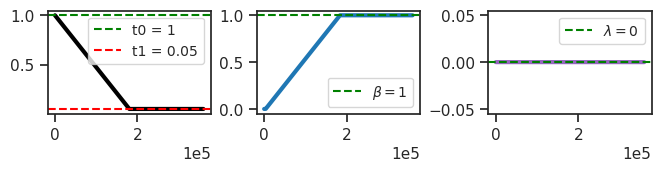

In [4]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [5]:
vae.fc_dec.bias.shape, vae.fc_enc.bias.shape

(torch.Size([1024]), torch.Size([10]))

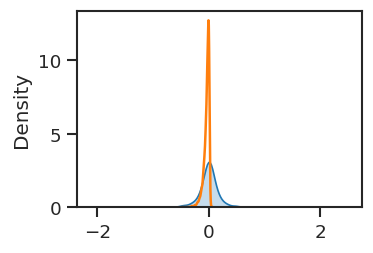

In [6]:
fig, ax = create_figure(dpi=120)
sns.kdeplot(tonp(vae.fc_enc.weight.data.ravel()), fill=True, label='enc')
sns.kdeplot(tonp(vae.fc_dec.weight.data.ravel()), color='C1', label='dec');

In [7]:
vae.cfg.init_scale

0.2

### Train

In [8]:
comment = f"init-both-scale{vae.cfg.init_scale}-df{2}+genlog_{tr.cfg.name()}"
# comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 1200, avg loss: 33.108809: 100%|██████████████████████| 1200/1200 [4:12:27<00:00, 12.62s/it]


---
### Test below
---

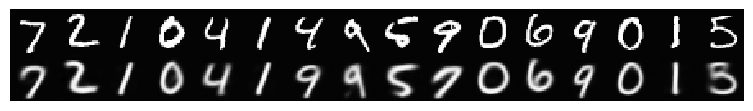

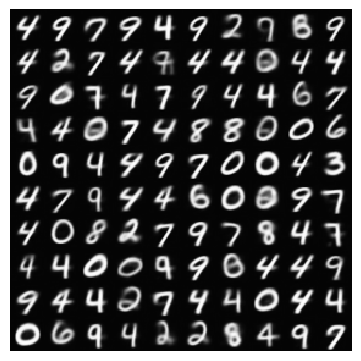

In [9]:
tr.show_recon(0.0), tr.show_samples(0.0);

### Loss vld (freeze)

In [10]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 27.506496, 'kl': 8.7160635, 'kl_diag': 0.87160635, 'tot': 36.22256}

### Identify dead neurons

In [25]:
dead_thres = 0.0
dead = loss['kl_diag'] < dead_thres
dead.sum()

0

In [26]:
loss['kl_diag']

array([0.7713082 , 0.8702297 , 0.90397036, 0.9228042 , 0.8346869 ,
       0.7604324 , 0.81887543, 0.9539644 , 0.9613526 , 1.0372803 ],
      dtype=float32)

### Spike counts

In [ ]:
lifetime, population, percents = sparse_score(data['z'], cutoff=0.01)
print(percents)

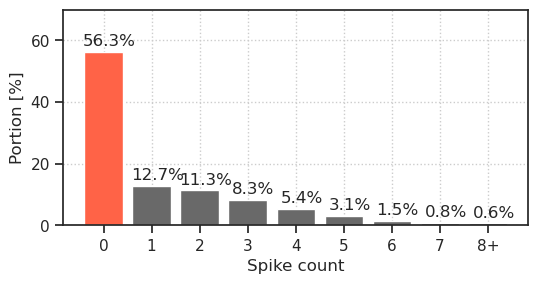

In [20]:
fig, ax = create_figure(1, 1, (6, 2.8))

max_val = float(list(percents.values())[0])
ax.set(
    xlabel='Spike count',
    ylabel='Portion [%]',
    ylim=(0, (np.ceil(max_val / 10) + 1) * 10),
)

colors = ['tomato' if lbl == '0' else 'dimgrey' for lbl in percents]
bars = ax.bar(percents.keys(), percents.values(), color=colors)

for bar in bars:
    y = bar.get_height()
    x = bar.get_x() + 1.3 * bar.get_width() / 2
    plt.text(x, y + 1, f'{y:0.1f}%', ha='center', va='bottom')

ax.locator_params(axis='y', nbins=5)

ax.grid()
plt.show()

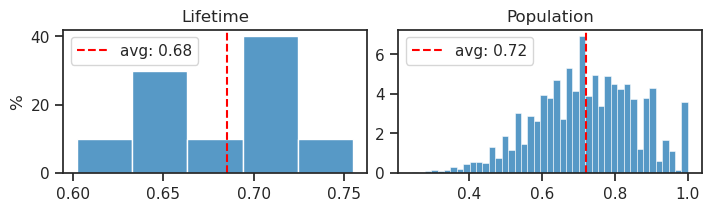

In [21]:
fig, axes = create_figure(1, 2, (7, 2), layout='constrained')

sns.histplot(lifetime, stat='percent', ax=axes[0])
sns.histplot(population, stat='percent', ax=axes[1])

for i, x2p in enumerate([lifetime, population]):
    _a, _med = np.nanmean(x2p), np.nanmedian(x2p)
    # axes[i].axvline(_med, color='g', ls='--', label=f'median: {_med:0.2f}')
    axes[i].axvline(_a, color='r', ls='--', label=f'avg: {_a:0.2f}')

add_legend(axes)
axes[0].set(title='Lifetime', ylabel='%')
axes[1].set(title='Population', ylabel='')
plt.show()

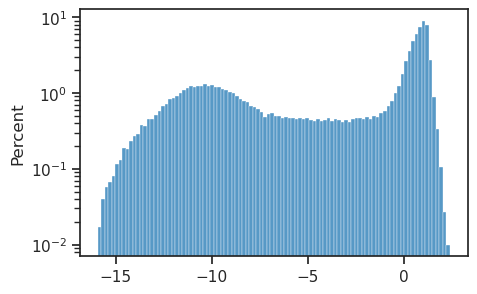

In [22]:
ax = sns.histplot(np.log(etc['r*dr'][:, ~dead].ravel()), stat='percent', bins=100)
ax.set_yscale('log')

In [23]:
log_posterior_rates = np.log(etc['r*dr'][:, ~dead]).ravel()
mu, sd = sp_stats.norm.fit(log_posterior_rates)
rv = sp_stats.norm(mu, sd)

xs = np.linspace(
    rv.ppf(1e-5),
    rv.ppf(1 - 1e-5),
    1000,
)
pdf = rv.pdf(xs)

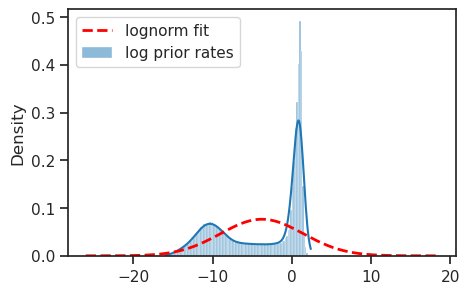

In [24]:
fig, ax = create_figure()

sns.histplot(log_posterior_rates, stat='density', bins=100, kde=True, label='log prior rates', ax=ax)
ax.plot(xs, pdf, color='r', lw=2, ls='--', label='lognorm fit')
add_legend(ax)
plt.show()

In [11]:
def _show_pairwise(i, j):
    df = pd.DataFrame({
        f'z-{i}': etc['r*dr'][:, i],
        f'z-{j}': etc['r*dr'][:, j],
        f'z-{i}_log': np.log(etc['r*dr'][:, i]),
        f'z-{j}_log': np.log(etc['r*dr'][:, j]),
        'lbl': tonp(tr.dl_vld.dataset.tensors[1]).astype(int),
    })
    fig, axes = create_figure(1, 2, (8, 4.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

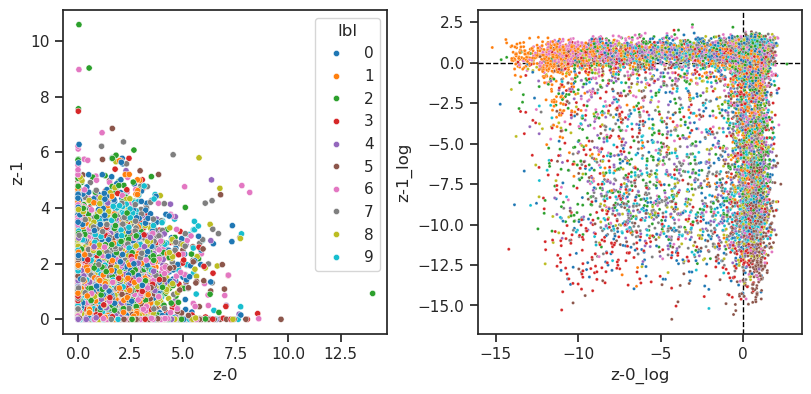

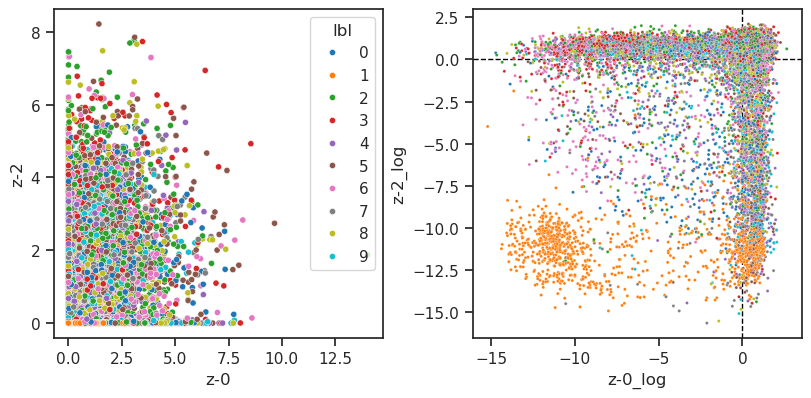

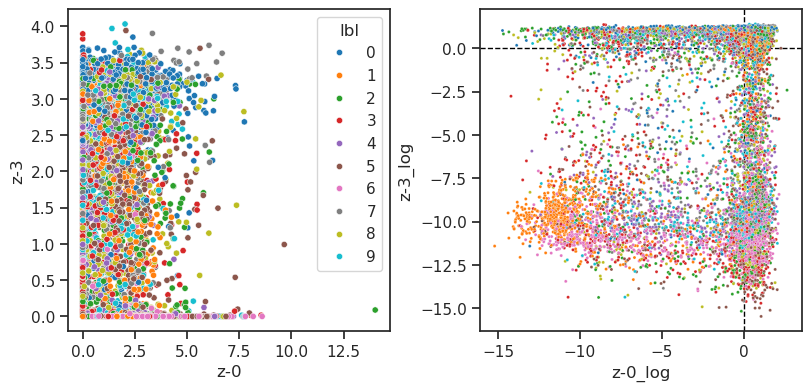

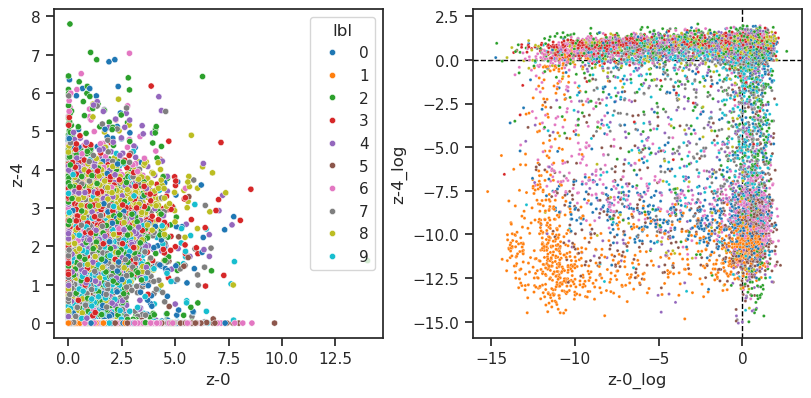

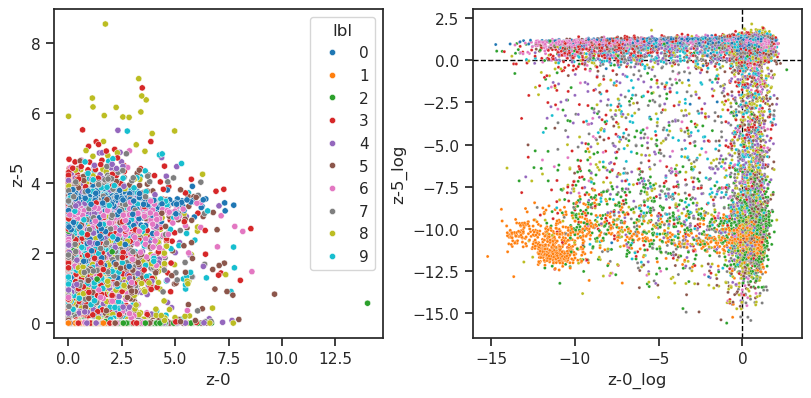

...

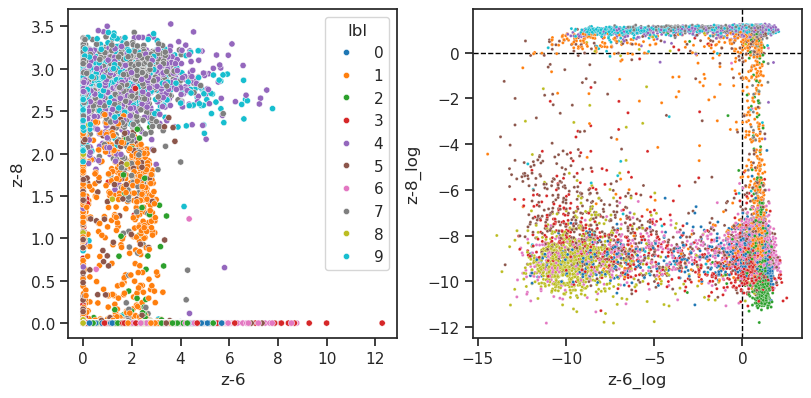

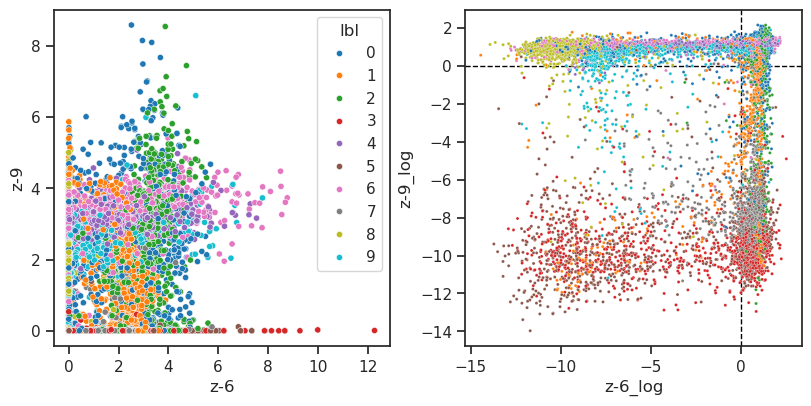

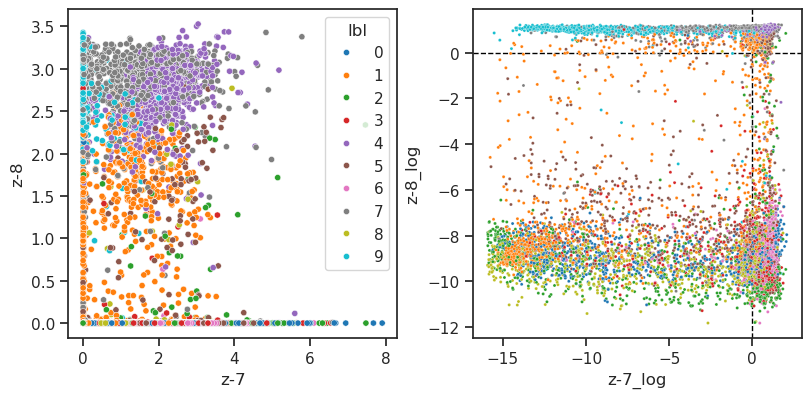

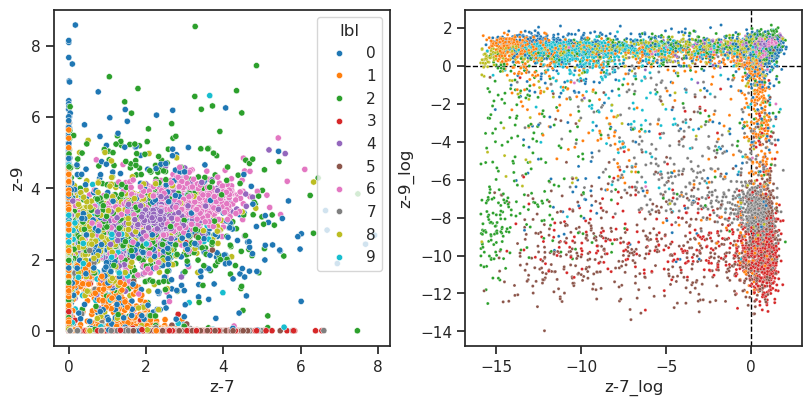

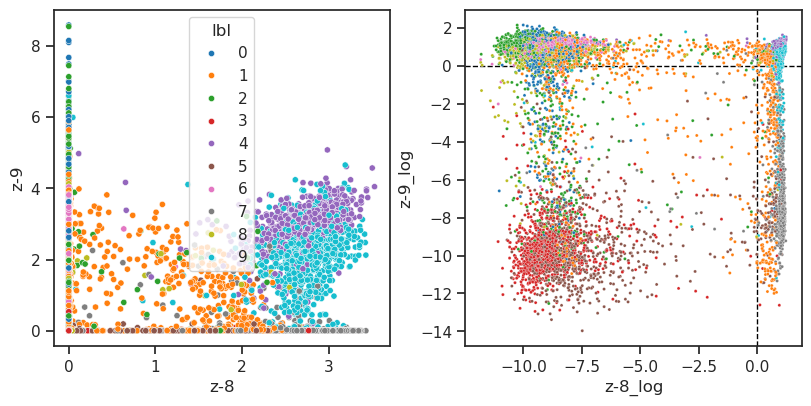

In [12]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j)

<Axes: ylabel='Count'>

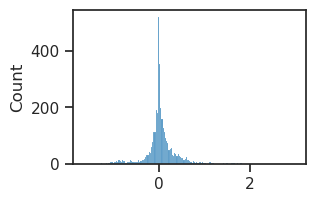

In [13]:
sns.histplot(tonp(torch.cat(vae.all_lognorm)))

In [14]:
(np.array(list(tr.stats['grad'].values())) > 500).sum() / len(tr.stats['grad'])

0.003952777777777778

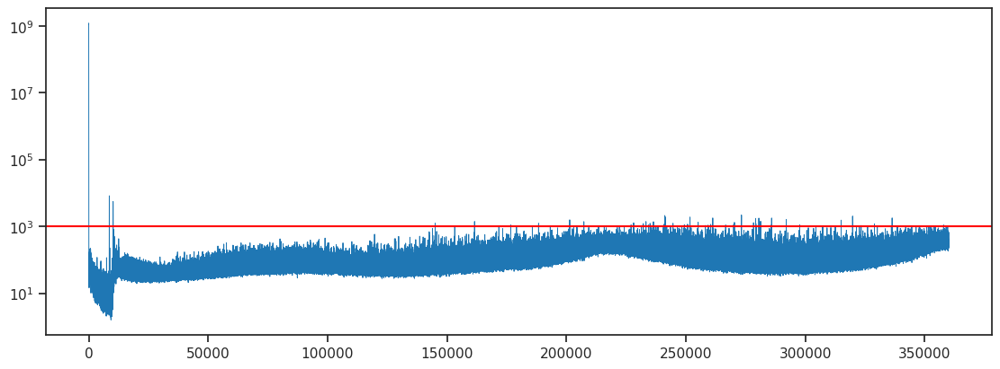

In [15]:
fig, ax = create_figure(1, 1, (11, 4))
plt.plot(tr.stats['grad'].keys(), tr.stats['grad'].values(), lw=0.7)
ax.axhline(tr.cfg.grad_clip, color='r')
ax.set(yscale='log')
plt.show()

In [16]:
df, df_summary = knn_analysis(
    x=etc['log_dr'],
    y=tonp(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 20, iter #0:   0%|                             | 0/801 [00:00<?, ?it/s]/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

In [17]:
df_summary

,mean,std
size,,
20,0.360026,0.053500
50,0.585156,0.053489
100,0.737322,0.032778
200,0.839064,0.021282
500,0.902768,0.009646
1000,0.926346,0.006015
2000,0.939546,0.004252
4000,0.947866,0.002197
5000,0.950200,NaN


In [18]:
vae.log_rate.min(), vae.log_rate.max()

(tensor(-0.0823, device='cuda:1', grad_fn=<MinBackward1>),
 tensor(0.5067, device='cuda:1', grad_fn=<MaxBackward1>))

In [19]:
vae.n_exp

tensor(24, device='cuda:1')

In [20]:
vae.log_rate.squeeze()

tensor([ 0.1609,  0.1210,  0.3191,  0.1309,  0.2173,  0.2881,  0.4106,  0.2028,
        -0.0823,  0.5067], device='cuda:1', grad_fn=<SqueezeBackward0>)